# 音乐的速度估计与节拍跟踪

## beat， tempo和rhythm
引用一段关于音乐节奏的描述：
> 試著回想當你在Youtube上點開一首歌，頁面上的播放條開始向右移動，旁邊顯示的時間開始計數，音樂隨著時間開始流瀉。你不自覺地舞動，搖頭晃腦、扭腰擺臀或者擊掌跺腳，而這些動作的頓點，像是在音樂中標記出一連串的時間點，這時你可能會發現這些頓點有不同的輕重緩急，其間似乎存在著某種規則，以致於你感覺自己似乎能夠預知下一刻的到來，你甚至忘情地開始跟著哼唱。這是一種我們與音樂之間常見的互動，通常在這種時刻，我們會說自己投入在音樂裡，而這種投入來自於與音樂同步的感受，而且我們知道它不只是來自其中的某些聲響，而是整首曲子，當然你仍然很有可能對其中的某些聲響特別著迷。

如以上聆听经验中，我们首先发现**音乐的节奏与时间密切相关**， 同时我们可以从中找到构成节奏的三个重音元素： **声音的时间点与时间点的间隔，声音的轻重缓急，以及在这些之上的某种规律性**。

**Beat（节拍）**是音乐在时间上的基本单位。提供音乐一个稳定持续的背景，使得我们可以听见一首曲子的节奏变化。 beat并不严格等分或等间隔，有一定弹性。
我们对时间更熟悉的单位时分/秒/时，面对beat，我们不仅想问，到底一拍有多长？ 

**Tempo（速度）**是指一首曲子的步调。古典时期（1750~1820），作曲家用意大利语来描述乐曲步调。
- Allegro，快板，欢快，120~160BPM
- Adagio， 舒缓，慢慢的，66~76BPM
- Andante，行板，走路的速度，76~108BPM
- presto，很快，168~100BPM

通过一些修饰语将其细分
* Molto Allegro， 非常快速
* Allegro non troppo， 不过分的快速
* Acceleranto，表示渐渐加快
* Sttreto，表示临时加快

因此，古典音乐中，tempo不止表示速度，还包含演奏指示，情感描述等 。

1816年，节拍器发明后，常用BPM（beats per minutes）来标明速度。


**Rhythm（节奏）**是对节拍特征规律不同方面的描述
1. **Meter，Time Signature（拍号）**是指不同轻重缓急的Beat， 遵循某种规律反复出现的规则称为Meter。通常我们用强弱对拍子进行简单区分
    * 二拍子（Duple）， 强/弱反复， 2/4
    * 三拍子（Triple），强/中/弱反复， 3/4
    * 和四拍子（Quadruple），强/弱/次强/弱 反复， 4/4


2. 有时也可以将Rhythm代指不同类型音乐
Cha Cha，Rumba，Tango， Waltz，...





## beat tracking， 节拍跟踪
beat tracking的目标：从音乐中提取周期性的节拍点。
> Tapping the foot when listening to music.

In [51]:
import librosa
import IPython.display as ipd
import madmom
import librosa.display
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import scipy

In [235]:
x, sr = librosa.load('happybirthdaytoyou.wav')
ipd.Audio(x, rate=sr)

In [237]:
proc = madmom.features.beats.DBNBeatTrackingProcessor(fps=100)
act = madmom.features.beats.RNNBeatProcessor()('happybirthdaytoyou.wav')
beat_times = proc(act)

clicks3 = librosa.clicks(beat_times, sr=sr, length=len(x))
ipd.Audio(x + clicks3, rate=sr)
#librosa.output.write_wav('happybirthdaytoyou_beats.wav', x + clicks3, sr=sr)

([], <a list of 0 Text xticklabel objects>)

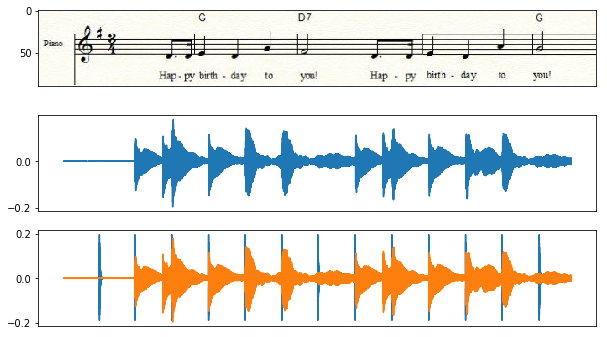

In [34]:
img=mpimg.imread('happybirthdaytoyou.png')
plt.figure(figsize=(10,6))
plt.subplot(3, 1, 1)
plt.imshow(img)
plt.xticks([])
plt.subplot(3, 1, 2)
plt.plot(x, label="happy birthday to you")
plt.xticks([])
plt.subplot(3, 1, 3)
plt.plot(clicks3 * 0.2, label="beats")
plt.plot(x, label="happy birthday to you")
plt.xticks([])

In [47]:
x, sr = librosa.load('chopin_mazurka_op68_no3.wav')
ipd.Audio(x, rate=sr)

In [46]:
x, sr = librosa.load('chopin_mazurka_op68_no3_beats_LR.wav')
ipd.Audio(x, rate=sr)

([], <a list of 0 Text xticklabel objects>)

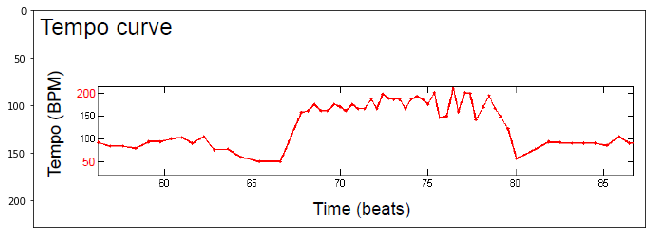

In [50]:
img=mpimg.imread('chopin_mazurka_op68_no3.png')
plt.figure(figsize=(16,4))
plt.imshow(img)
plt.xticks([])

tempo在50~200BPM之间变化，beats tracking需要跟踪这种变化。

# beat tracking算法的挑战
1. beat能量信息并不清晰
2. tempo的突然变化（速度是有弹性的）
3. 节奏信息模糊，（比如，重音不在第一拍）

### 子任务
1. Onset detecting
2. Beat tracking
3. Tempo estimation

### Onset Detection
寻找音频元素的起始时间，这里指音符弹奏的起始时间。 

Onset一般发生在以下信号特性改变的时刻：
* 能量或响度
* 音高或和弦
* 音色



#### 基于能量的Onset detection

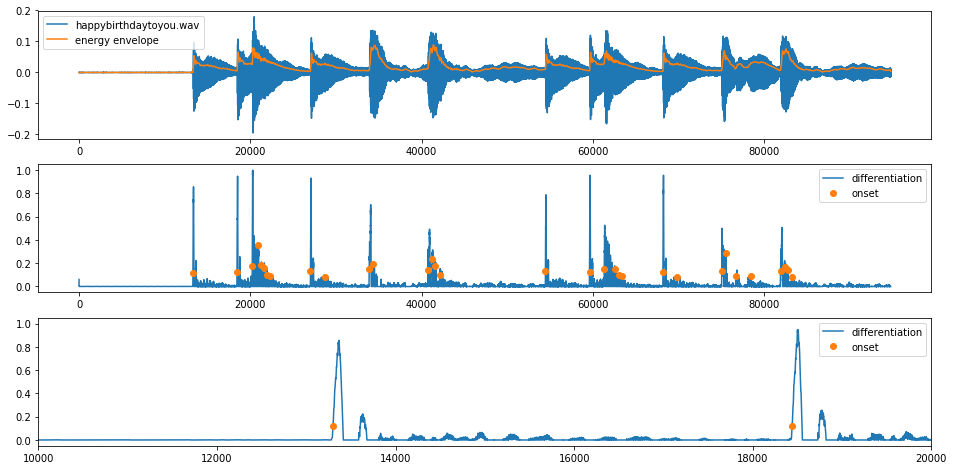

In [164]:
fname = 'happybirthdaytoyou.wav'
sin_window = np.sqrt(scipy.signal.get_window('hann', 128))
x, sr = librosa.load(fname, sr=8000)
x_sqE = np.sqrt(np.power(x, 2.0))
x_env = np.convolve(x_sqE, sin_window, mode='same') / np.sum(sin_window)
x_diff = x_env.copy()
x_diff[1:] = np.maximum(x_env[1:] - x_env[:-1], 0.0)
x_diff -= x_diff.min()
x_diff /= x_diff.max()
peaks = librosa.util.peak_pick(x_diff, 240, 1, 800, 801, 0.07, 240)

plt.figure(figsize=(16,8))
plt.subplot(3, 1, 1)
plt.plot(x, label=fname)
plt.plot(x_env, label='energy envelope')
plt.legend(frameon=True)
plt.subplot(3, 1, 2)
plt.plot(x_diff, label='differentiation')
plt.plot(peaks, x_diff[peaks], 'o', label='onset')
plt.legend(frameon=True)
plt.subplot(3, 1, 3)
plt.plot(x_diff, label='differentiation')
plt.plot(peaks, x_diff[peaks], 'o', label='onset')
plt.xlim([10000, 20000])
plt.legend(frameon=True)

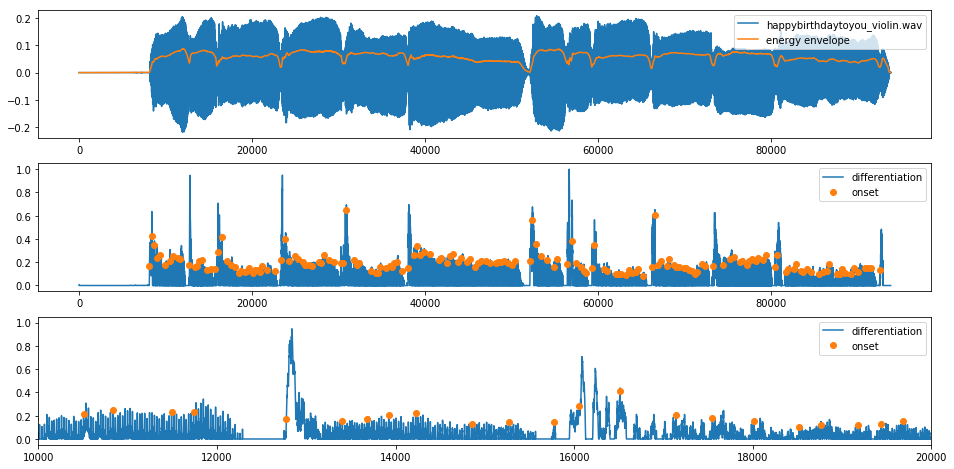

In [165]:
fname = 'happybirthdaytoyou_violin.wav'
sin_window = np.sqrt(scipy.signal.get_window('hann', 128))
x, sr = librosa.load(fname, sr=8000)
x_sqE = np.sqrt(np.power(x, 2.0))
x_env = np.convolve(x_sqE, sin_window, mode='same') / np.sum(sin_window)
x_diff = x_env.copy()
x_diff[1:] = np.maximum(x_env[1:] - x_env[:-1], 0.0)
x_diff -= x_diff.min()
x_diff /= x_diff.max()
peaks = librosa.util.peak_pick(x_diff, 240, 1, 800, 801, 0.07, 240)

plt.figure(figsize=(16,8))
plt.subplot(3, 1, 1)
plt.plot(x, label=fname)
plt.plot(x_env, label='energy envelope')
plt.legend(frameon=True)
plt.subplot(3, 1, 2)
plt.plot(x_diff, label='differentiation')
plt.plot(peaks, x_diff[peaks], 'o', label='onset')
plt.legend(frameon=True)
plt.subplot(3, 1, 3)
plt.plot(x_diff, label='differentiation')
plt.plot(peaks, x_diff[peaks], 'o', label='onset')
plt.xlim([10000, 20000])
plt.legend(frameon=True)

由上面两个例子可以看出，基于能量的算法适合于打击类乐器，对弦乐来说，音符的起始能量不突出。对复杂混音（多乐器场景），也没有明显能量变化。因此需要更精细的方法。

### 基于短时频谱的Onset detection


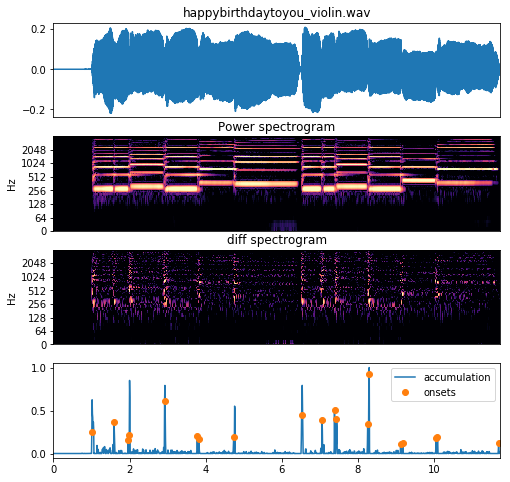

In [206]:
fname = 'happybirthdaytoyou_violin.wav'
x, sr = librosa.load(fname, sr=8000)
y = librosa.stft(x, n_fft=512, hop_length=64, win_length=256)
Ay = np.abs(y)
Ay_diff = np.maximum(Ay[:, 1:] - Ay[:, :-1], 0.0)
y_acc = librosa.util.sync(Ay_diff, [slice(None)], aggregate=np.median, pad=True,axis=0)
y_acc = y_acc[0,:]
y_acc -= y_acc.min()
y_acc /= y_acc.max()
onsets = librosa.util.peak_pick(y_acc, 3, 1, 12, 13, 0.07, 3)

plt.figure(figsize=(8,8))
plt.subplot(4, 1, 1)
plt.plot(x)
plt.title(fname)
plt.xticks([])
plt.xlim([0, len(x)])
plt.subplot(4, 1, 2)
librosa.display.specshow(librosa.amplitude_to_db(Ay, ref=np.max), sr=sr, hop_length=64, y_axis='log', vmin=-45, vmax=-5)
plt.title('Power spectrogram')
plt.subplot(4, 1, 3)
librosa.display.specshow(librosa.amplitude_to_db(Ay_diff, ref=np.max), sr=sr, hop_length=64, y_axis='log', vmin=-45, vmax=-5)
plt.title('diff spectrogram')
plt.subplot(4, 1, 4)
times = librosa.frames_to_time(np.arange(y_acc.shape[0]),sr=sr,hop_length=64)
plt.plot(times, y_acc, label='accumulation')
plt.plot(times[onsets], y_acc[onsets], 'o', label='onsets')
plt.axis('tight')
plt.xlim([times[0], times[-1]])
plt.legend(frameon=True)

onset detection的结果作为下一步beat tracking的候选点。

### Beat tracking
再回顾一下，什么是Beat？
- 指示音乐行进的稳定时间刻度
- 为一段音乐提供节奏背景
- 不严格的等间隔
- 人跟随音乐打节拍

算法策略：
- 分析onset候选点的周期/半周期模式

#### 动态规划算法
假设：
1. 最强音符的起始位置最有可能是beat
2. tempo基本稳定

有研究表明，人对节拍的感知，更倾向于平滑节拍间的间隔，而不是严格遵循强音符的位置。

基本思想： 

根据以上两个假设构造价值函数，评价一个beat序列的得分。

$$
C\left(\left\{t_{i}\right\}\right)=\sum_{i=1}^{N} O\left(t_{i}\right)+\alpha \sum_{i=2}^{N} F\left(t_{i}-t_{i-1}, \tau_{p}\right)
$$

其中$\{t_i\}$是算法得到的beats序列，$O(t_i)$是“onset strength envelope”即前面探测到的不同能量大小的Onset序列。

$F\left(t_{i}-t_{i-1}, \tau_{p}\right)$beats序列间隔与全局tempo之间一致性的评价函数。

$\alpha$是平衡以上两个因素的权重。



$F$函数如下：
$$
F(\Delta t, \tau)=-\left(\log \frac{\Delta t}{\tau}\right)^{2}
$$

$F$函数当$\Delta t = \tau$时取得最大值$0$，$\Delta t$与$\tau$偏差越大，$F$值越小。并且取值在*log-time*域上对称：$F(k\tau, \tau)=F(\tau/k, \tau)$。



动态规划算法的关键点是，价值函数最优值可以通过递归等式计算得到。
$$
C^{*}(t)=O(t)+\max _{\tau=0 ... t}\left\{\alpha F\left(t-\tau, \tau_{p}\right)+C^{*}(\tau)\right\}
$$
当前时刻$t$的价值函数值由两部分构成， 前一部分是当前时刻点的onset强度；后一部分是选取$t$时刻之前的最佳时刻$\tau$使得$t - \tau$与$\tau _p$一致并且$C^{*}(\tau)$值较大。

计算$C^{*}(t)$的同时，记录下最优$\tau$：
$$
P^{*}(t)=\arg \max _{\tau=0 . . t}\left\{\alpha F\left(t-\tau, \tau_{p}\right)+C^{*}(\tau)\right\}
$$



由以上公式，动态规划算法描述如下：
1. 根据onset envelope从0开始，逐点计算价值函数$C^{*}(t)$和最优间隔点$P^{*}(t)$
2. 从完成的价值函数曲线中选取最大值$t_{max} = \arg \max\left\{C^{*}(t)\right\}$作为beats序列最后一个点$t_{N}$
3. 根据$P^{*}(t)$值，反向选择beats序列其余点，
$$t_{N-1} = P^{*}(t_{N}), ..., t_{n-1} = P^{*}(t_{n}), ..., t_0 = P^{*}(t_1)$$

下图来源于MIREX 2006 Beat Tracking 算法竞赛的结果。P-Score大概表明了beats序列估计的准确程度。

大致表明，最优算法会优于人的平均水平，但低于专业人士水平。


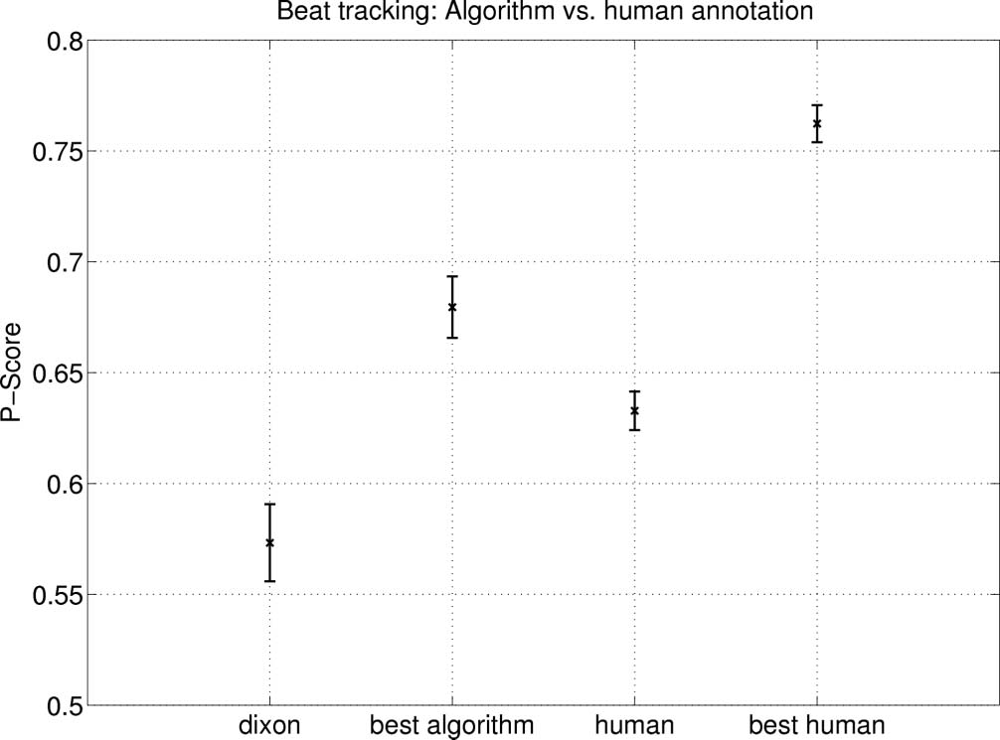
参考：M. F. McKinney, D. Moelants, M. E. P. Davies, and A. Klapuri, "Evaluation of audio beat tracking and music tempo extraction algorithms," Journal of New Music Research, vol. 36, no. 1, pp. 1ΓÇô16, 2007.

来源于MIREX 2006 Beat Tracking 算法竞赛的结果。
P-Score大概表明了beats序列估计的准确程度。
- dixon 是当时最佳算法的平均得分。
- best algorithm 是对每条测试序列，参赛算法最佳得分的均值
- human 是参与测试数据标注的测试者的平均得分
- best human 是对每条测试序列，测试者最佳得分的均值

测试者包含音乐专业和非专业者。

Text(0.5,1,'MIREX 2006~2018 Beat tracking best results')

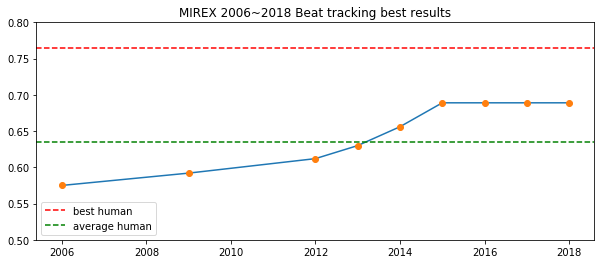

In [234]:
years = [2006, 2009, 2012, 2013, 2014, 2015, 2016, 2017, 2018]
pscore = [0.575, 0.592, 0.612, 0.630, 0.656, 0.689, 0.689, 0.689, 0.689]
plt.figure(figsize=(10,4))
plt.plot(years, pscore)
plt.plot(years, pscore, 'o')
plt.axhline(0.765, color='r', linestyle='--', alpha=1,label='best human')
plt.axhline(0.635, color='g', linestyle='--', alpha=1,label='average human')
plt.ylim([0.5, 0.8])
plt.legend(frameon=True, framealpha=0.75)
plt.title('MIREX 2006~2018 Beat tracking best results')

上图是MIREX beat tracking竞赛从2006年至2018年的最佳成绩，也是优于人的平均水平，但距离专业人士还有差距。